# A. Summary

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Load the data
df = pd.read_csv('happiness_data.csv')
df.sample(5)

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
965,Latvia,2018,5.901,10.307,0.913,66.80,0.608,-0.212,0.799,0.585,0.192
160,Belgium,2020,6.839,10.771,0.904,72.40,0.767,-0.164,0.634,0.647,0.260
1135,Moldova,2018,5.682,9.423,0.892,65.00,0.824,-0.084,0.929,0.582,0.270
1843,United States,2013,7.249,10.939,0.925,68.64,0.792,0.274,0.747,0.814,0.260
1192,Namibia,2014,4.574,9.232,0.763,55.16,0.849,-0.183,0.790,0.749,0.239


In [ ]:
# Summarize data
print(f"Number of rows: {len(df)}")
print(f"Number of columns: {len(df.columns)}")

# Identify continuous and categorical columns
continuous_cols = df.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = df.select_dtypes(include=['object']).columns

print("\nContinuous columns:")
print(continuous_cols)
print("\nCategorical columns:")
print(categorical_cols)

Number of rows: 1949
Number of columns: 11

Continuous columns:
Index(['year', 'Life Ladder', 'Log GDP per capita', 'Social support',
       'Healthy life expectancy at birth', 'Freedom to make life choices',
       'Generosity', 'Perceptions of corruption', 'Positive affect',
       'Negative affect'],
      dtype='object')

Categorical columns:
Index(['Country name'], dtype='object')


In [ ]:
# Display summary statistics
print(df.describe())

              year  Life Ladder  Log GDP per capita  Social support  \
count  1949.000000  1949.000000         1913.000000     1936.000000   
mean   2013.216008     5.466705            9.368453        0.812552   
std       4.166828     1.115711            1.154084        0.118482   
min    2005.000000     2.375000            6.635000        0.290000   
25%    2010.000000     4.640000            8.464000        0.749750   
50%    2013.000000     5.386000            9.460000        0.835500   
75%    2017.000000     6.283000           10.353000        0.905000   
max    2020.000000     8.019000           11.648000        0.987000   

       Healthy life expectancy at birth  Freedom to make life choices  \
count                       1894.000000                   1917.000000   
mean                          63.359374                      0.742558   
std                            7.510245                      0.142093   
min                           32.300000                      0.25800

In [ ]:
# Missing Values/Null Values Count
df.isna().sum()
df.isnull().sum()

,0
Country name,0
year,0
Life Ladder,0
Log GDP per capita,36
Social support,13
Healthy life expectancy at birth,55
Freedom to make life choices,32
Generosity,89
Perceptions of corruption,110
Positive affect,22


In [ ]:
# Check for outliers
def detect_outliers(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return len(outliers)

print("\nNumber of outliers:")
for col in continuous_cols:
    print(f"{col}: {detect_outliers(df, col)}")


Number of outliers:
year: 0
Life Ladder: 0
Log GDP per capita: 0
Social support: 43
Healthy life expectancy at birth: 15
Freedom to make life choices: 10
Generosity: 36
Perceptions of corruption: 164
Positive affect: 3
Negative affect: 29


In [ ]:
# Display statistical summary for each attribute
print("Statistical Summary:")
summary = df.describe()
print(summary)

Statistical Summary:
              year  Life Ladder  Log GDP per capita  Social support  \
count  1949.000000  1949.000000         1913.000000     1936.000000   
mean   2013.216008     5.466705            9.368453        0.812552   
std       4.166828     1.115711            1.154084        0.118482   
min    2005.000000     2.375000            6.635000        0.290000   
25%    2010.000000     4.640000            8.464000        0.749750   
50%    2013.000000     5.386000            9.460000        0.835500   
75%    2017.000000     6.283000           10.353000        0.905000   
max    2020.000000     8.019000           11.648000        0.987000   

       Healthy life expectancy at birth  Freedom to make life choices  \
count                       1894.000000                   1917.000000   
mean                          63.359374                      0.742558   
std                            7.510245                      0.142093   
min                           32.300000        

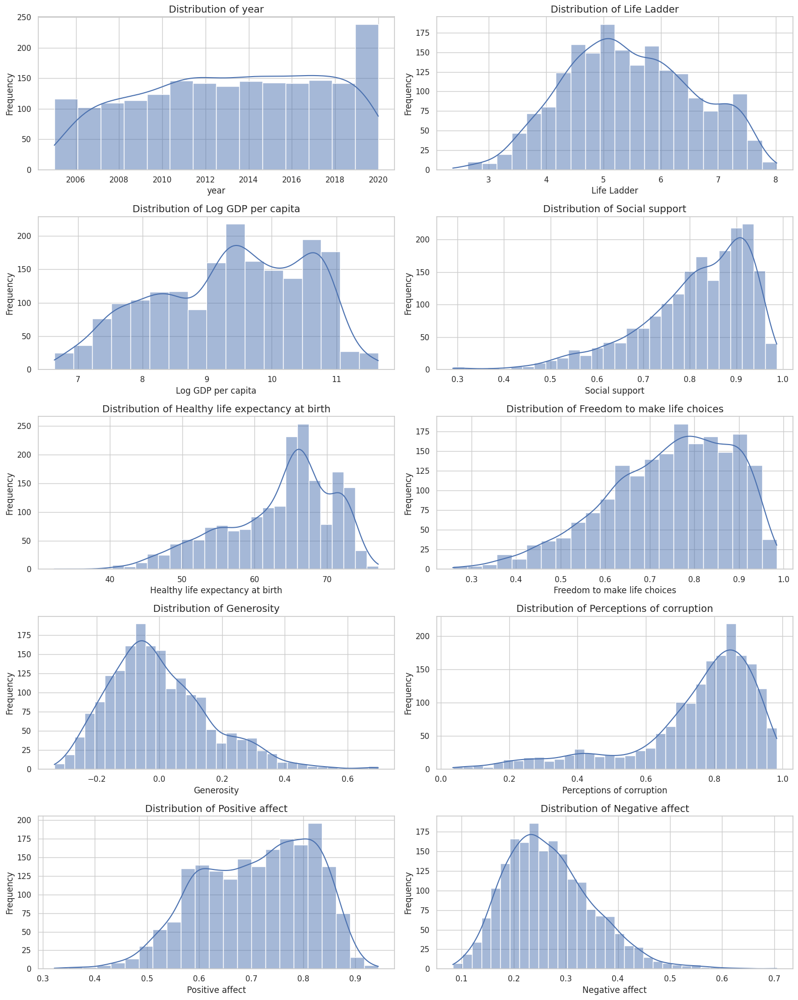

In [ ]:
#Distribution of each attribute

plt.figure(figsize=(16, 20))

continuous_columns = ['year', 'Life Ladder', 'Log GDP per capita', 'Social support',
                      'Healthy life expectancy at birth', 'Freedom to make life choices',
                      'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']

for i, column in enumerate(continuous_columns, 1):
    plt.subplot(5, 2, i)
    sns.histplot(df[column].dropna(), kde=True)
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


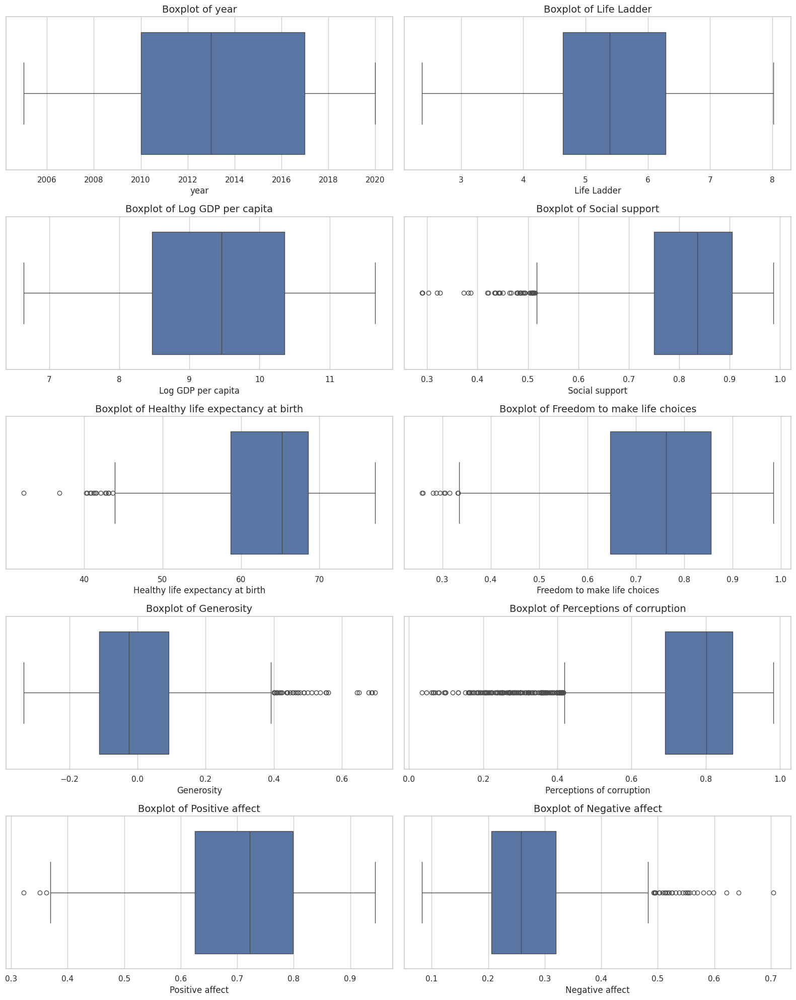

In [ ]:
# Visualizing outliers with Boxplots
plt.figure(figsize=(16, 20))

for i, column in enumerate(continuous_columns, 1):
    plt.subplot(5, 2, i)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}', fontsize=14)
    plt.xlabel(column)

plt.tight_layout()
plt.show()


In [ ]:
# Check for missing values
print("\nMissing Values:")
missing_values = df.isnull().sum()
print(missing_values)



Missing Values:
Country name                          0
year                                  0
Life Ladder                           0
Log GDP per capita                   36
Social support                       13
Healthy life expectancy at birth     55
Freedom to make life choices         32
Generosity                           89
Perceptions of corruption           110
Positive affect                      22
Negative affect                      16
dtype: int64


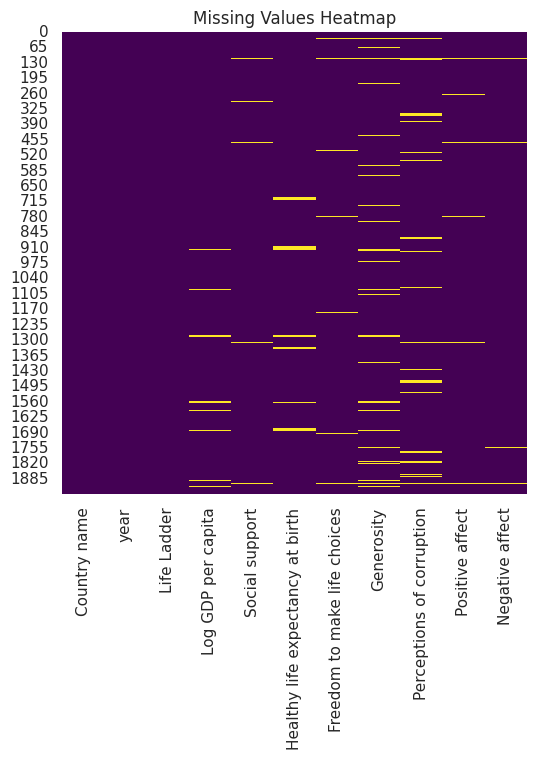

In [ ]:
# Optional: Visualize missing values with a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [ ]:
## Identify skewness
for column in continuous_columns:
    skewness = df[column].skew()
    kurt = df[column].kurtosis()
    print(f"\n{column} - Skewness: {skewness}, Kurtosis: {kurt}")


year - Skewness: -0.128238326674531, Kurtosis: -1.0776741485722003

Life Ladder - Skewness: 0.0684831797859023, Kurtosis: -0.6886068660775093

Log GDP per capita - Skewness: -0.30845255865024496, Kurtosis: -0.8636224081948329

Social support - Skewness: -1.110682140580586, Kurtosis: 1.1844507119746197

Healthy life expectancy at birth - Skewness: -0.7444258022785646, Kurtosis: -0.05323508776088115

Freedom to make life choices - Skewness: -0.6230188679041034, Kurtosis: -0.1263983456403861

Generosity - Skewness: 0.8071402481021066, Kurtosis: 0.8408832191926745

Perceptions of corruption - Skewness: -1.496045365191314, Kurtosis: 1.8389011270478326

Positive affect - Skewness: -0.36419705052474194, Kurtosis: -0.5830554015001699

Negative affect - Skewness: 0.7371659338889655, Kurtosis: 0.868068564672225


In [ ]:
# Check for negative values in data
for column in continuous_columns:
    if (df[column] < 0).any():
      print(f"{column} has negative values; consider adjusting or re-evaluating its scale.")


Generosity has negative values; consider adjusting or re-evaluating its scale.


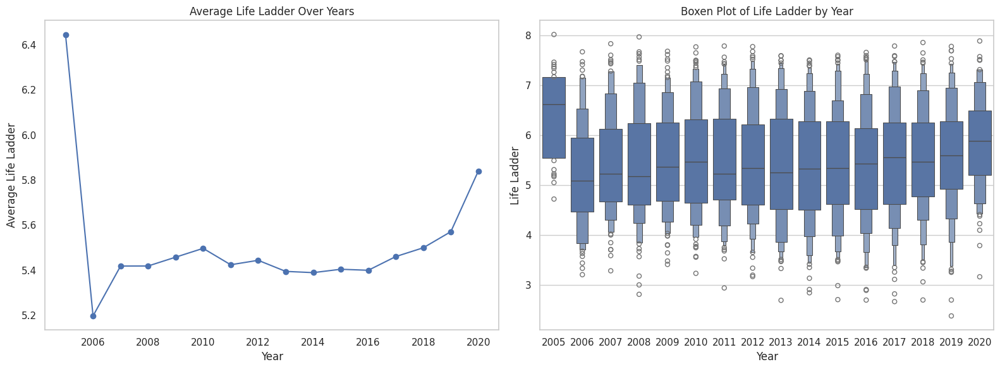

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Average Life Ladder Over Years
df.groupby('year')['Life Ladder'].mean().plot(ax=axes[0], marker='o')
axes[0].set_title('Average Life Ladder Over Years')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Average Life Ladder')
axes[0].grid()

# Plot 2: Boxen Plot of Life Ladder by Year
sns.boxenplot(x='year', y='Life Ladder', data=df, ax=axes[1])
axes[1].set_title('Boxen Plot of Life Ladder by Year')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Life Ladder')

plt.tight_layout()
plt.show()


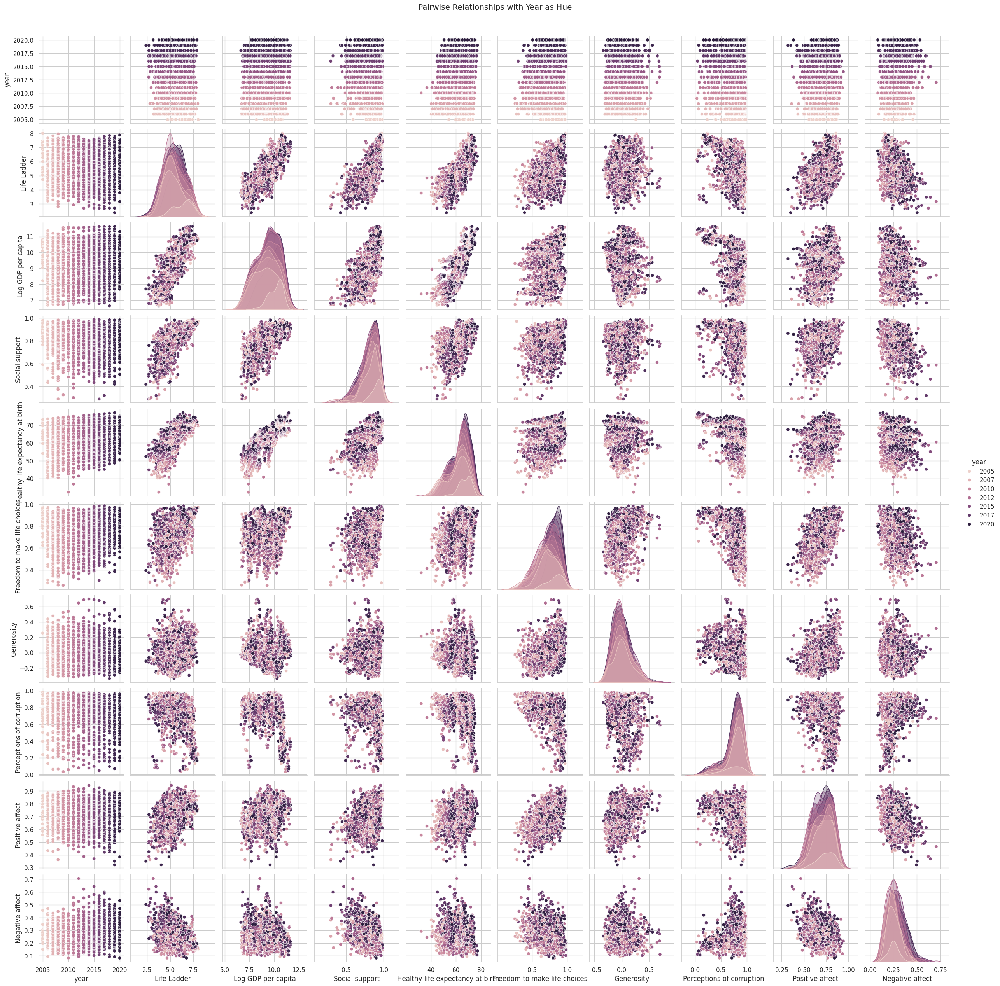

In [ ]:
sns.pairplot(df, hue='year', vars=continuous_columns)
plt.suptitle("Pairwise Relationships with Year as Hue", y=1.02)
plt.show()


#B.

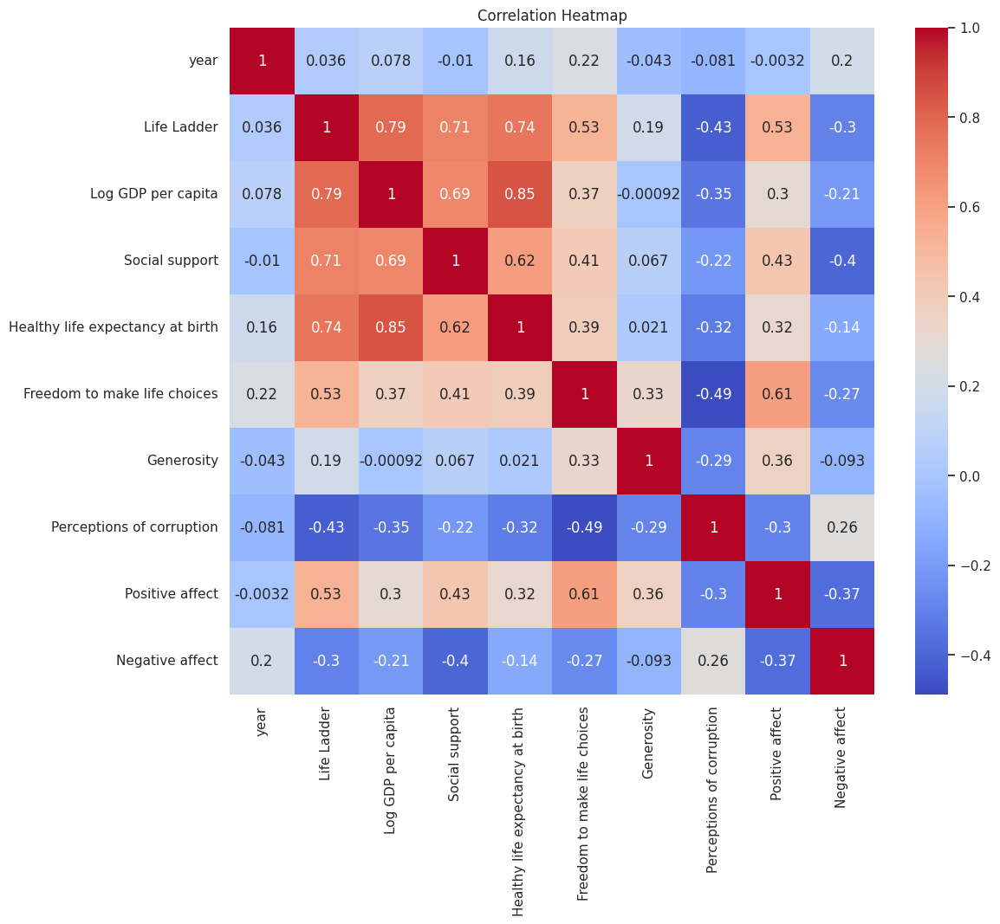

In [ ]:
# Compute correlation matrix
corr = df[continuous_cols].corr()

# Plot heatmap
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
# Compute Pearson Correlation Coefficient
df.corr(method='pearson', numeric_only=True)

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
year,1.000000,0.035515,0.078246,-0.010093,0.164059,0.222151,-0.043422,-0.081478,-0.003245,0.196869
Life Ladder,0.035515,1.000000,0.790166,0.707806,0.744506,0.528063,0.190632,-0.427245,0.532273,-0.297488
Log GDP per capita,0.078246,0.790166,1.000000,0.692602,0.848049,0.367932,-0.000915,-0.345511,0.302282,-0.210781
Social support,-0.010093,0.707806,0.692602,1.000000,0.616037,0.410402,0.067000,-0.219040,0.432152,-0.395865
Healthy life expectancy at birth,0.164059,0.744506,0.848049,0.616037,1.000000,0.388681,0.020737,-0.322461,0.318247,-0.139477
Freedom to make life choices,0.222151,0.528063,0.367932,0.410402,0.388681,1.000000,0.329300,-0.487883,0.606114,-0.267661
Generosity,-0.043422,0.190632,-0.000915,0.067000,0.020737,0.329300,1.000000,-0.290706,0.358006,-0.092542
Perceptions of corruption,-0.081478,-0.427245,-0.345511,-0.219040,-0.322461,-0.487883,-0.290706,1.000000,-0.296517,0.264225
Positive affect,-0.003245,0.532273,0.302282,0.432152,0.318247,0.606114,0.358006,-0.296517,1.000000,-0.374439
Negative affect,0.196869,-0.297488,-0.210781,-0.395865,-0.139477,-0.267661,-0.092542,0.264225,-0.374439,1.000000


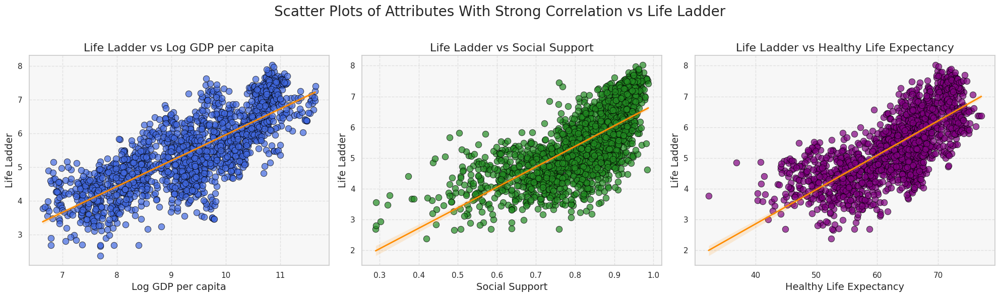

In [ ]:
#Scatterplots for Strong positive correlations [Log GDP per capita (0.79), Log GDP per capita (0.79), Healthy life expectancy (0.74)]

import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create a figure with subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Scatter Plots of Attributes With Strong Correlation vs Life Ladder', fontsize=20)

# Scatter plot for Log GDP per capita
sns.scatterplot(x='Log GDP per capita', y='Life Ladder', data=df, ax=axs[0],
                color='royalblue', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Log GDP per capita', y='Life Ladder', data=df, ax=axs[0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0].set_title('Life Ladder vs Log GDP per capita', fontsize=16)
axs[0].set_xlabel('Log GDP per capita', fontsize=14)
axs[0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Social support
sns.scatterplot(x='Social support', y='Life Ladder', data=df, ax=axs[1],
                color='forestgreen', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Social support', y='Life Ladder', data=df, ax=axs[1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1].set_title('Life Ladder vs Social Support', fontsize=16)
axs[1].set_xlabel('Social Support', fontsize=14)
axs[1].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Healthy life expectancy at birth
sns.scatterplot(x='Healthy life expectancy at birth', y='Life Ladder', data=df, ax=axs[2],
                color='purple', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Healthy life expectancy at birth', y='Life Ladder', data=df, ax=axs[2],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[2].set_title('Life Ladder vs Healthy Life Expectancy', fontsize=16)
axs[2].set_xlabel('Healthy Life Expectancy', fontsize=14)
axs[2].set_ylabel('Life Ladder', fontsize=14)

# Customize the grid
for ax in axs:
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_facecolor('#f7f7f7')  # Light grey background

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout
plt.show()


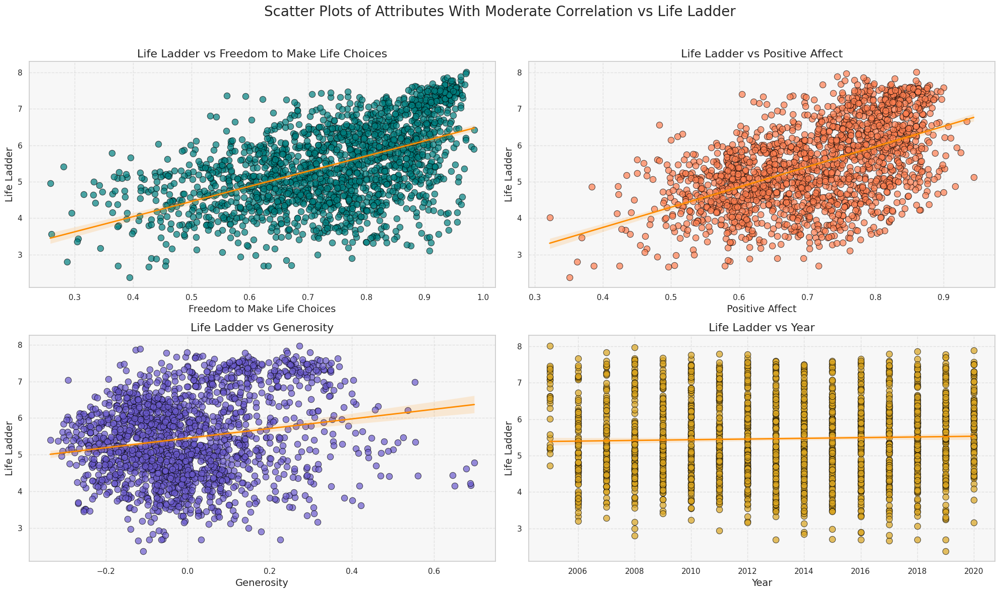

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle('Scatter Plots of Attributes With Moderate Correlation vs Life Ladder', fontsize=20)

# Scatter plot for Freedom to make life choices
sns.scatterplot(x='Freedom to make life choices', y='Life Ladder', data=df, ax=axs[0, 0],
                color='teal', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Freedom to make life choices', y='Life Ladder', data=df, ax=axs[0, 0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0, 0].set_title('Life Ladder vs Freedom to Make Life Choices', fontsize=16)
axs[0, 0].set_xlabel('Freedom to Make Life Choices', fontsize=14)
axs[0, 0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Positive affect
sns.scatterplot(x='Positive affect', y='Life Ladder', data=df, ax=axs[0, 1],
                color='coral', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Positive affect', y='Life Ladder', data=df, ax=axs[0, 1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0, 1].set_title('Life Ladder vs Positive Affect', fontsize=16)
axs[0, 1].set_xlabel('Positive Affect', fontsize=14)
axs[0, 1].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Generosity
sns.scatterplot(x='Generosity', y='Life Ladder', data=df, ax=axs[1, 0],
                color='slateblue', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Generosity', y='Life Ladder', data=df, ax=axs[1, 0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1, 0].set_title('Life Ladder vs Generosity', fontsize=16)
axs[1, 0].set_xlabel('Generosity', fontsize=14)
axs[1, 0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Year
sns.scatterplot(x='year', y='Life Ladder', data=df, ax=axs[1, 1],
                color='goldenrod', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='year', y='Life Ladder', data=df, ax=axs[1, 1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1, 1].set_title('Life Ladder vs Year', fontsize=16)
axs[1, 1].set_xlabel('Year', fontsize=14)
axs[1, 1].set_ylabel('Life Ladder', fontsize=14)

# Customize the grid
for ax in axs.flatten():
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_facecolor('#f7f7f7')  # Light grey background

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout
plt.show()


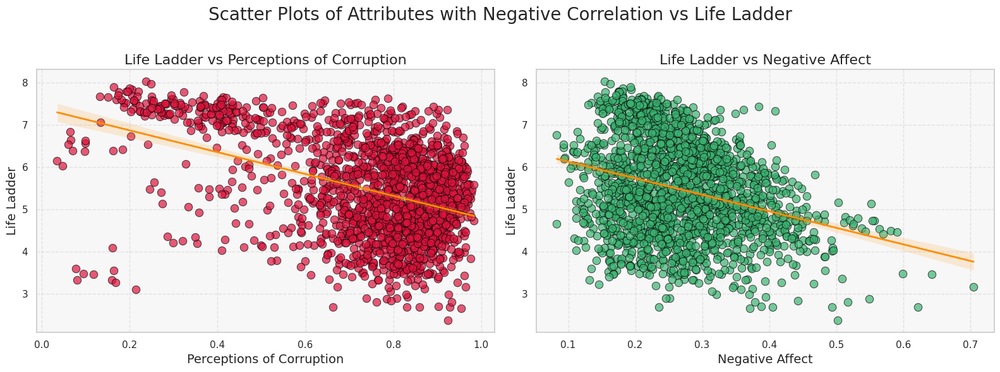

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create a figure with subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Scatter Plots of Attributes with Negative Correlation vs Life Ladder', fontsize=20)

# Scatter plot for Perceptions of corruption
sns.scatterplot(x='Perceptions of corruption', y='Life Ladder', data=df, ax=axs[0],
                color='crimson', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Perceptions of corruption', y='Life Ladder', data=df, ax=axs[0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0].set_title('Life Ladder vs Perceptions of Corruption', fontsize=16)
axs[0].set_xlabel('Perceptions of Corruption', fontsize=14)
axs[0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Negative affect
sns.scatterplot(x='Negative affect', y='Life Ladder', data=df, ax=axs[1],
                color='mediumseagreen', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Negative affect', y='Life Ladder', data=df, ax=axs[1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1].set_title('Life Ladder vs Negative Affect', fontsize=16)
axs[1].set_xlabel('Negative Affect', fontsize=14)
axs[1].set_ylabel('Life Ladder', fontsize=14)

# Customize the grid
for ax in axs:
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_facecolor('#f7f7f7')  # Light grey background

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout
plt.show()


#C.

In [ ]:
#Handling missing values:

for col in continuous_columns:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].mean(), inplace=True)  # Mean imputation


In [ ]:
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])


Series([], dtype: int64)


In [ ]:
print("\nNumber of outliers:")
for col in continuous_cols:
    print(f"{col}: {detect_outliers(df, col)}")

# Determine outlier thresholds
lower_bound = Q1 - 2.5 * IQR
upper_bound = Q3 + 2.5 * IQR

# Handle outliers through Capping:
for col in ['Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices']:
  df[col] = np.where(df[col] > upper_bound[col], upper_bound[col], df[col])
  df[col] = np.where(df[col] < lower_bound[col], lower_bound[col], df[col])

print("\nNumber of outliers after capping:")
for col in continuous_cols:
    print(f"{col}: {detect_outliers(df, col)}")


Number of outliers:
year: 0
Life Ladder: 0
Log GDP per capita: 0
Social support: 45
Healthy life expectancy at birth: 23
Freedom to make life choices: 11
Generosity: 42
Perceptions of corruption: 189
Positive affect: 4
Negative affect: 29

Number of outliers after capping:
year: 0
Life Ladder: 0
Log GDP per capita: 0
Social support: 45
Healthy life expectancy at birth: 23
Freedom to make life choices: 11
Generosity: 42
Perceptions of corruption: 189
Positive affect: 4
Negative affect: 29


#D.

In [ ]:
from sklearn.model_selection import train_test_split

# Split data
X = df.drop(['Life Ladder', 'year', 'Country name'], axis=1)
y = df['Life Ladder']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Verify representativeness
print("Full dataset mean:", y.mean())
print("Test set mean:", y_test.mean())

print("\nFull dataset std:", y.std())
print("Test set std:", y_test.std())

Full dataset mean: 5.46670548999487
Test set mean: 5.494120901639345

Full dataset std: 1.1157105016473912
Test set std: 1.1118663572754932


In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1461, 8)
(488, 8)
(1461,)
(488,)


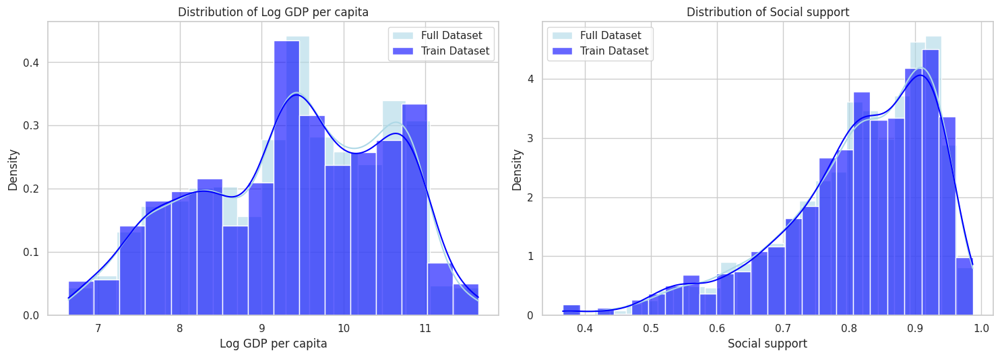

In [ ]:
#Verifying the split
key_columns = ['Log GDP per capita', 'Social support']

plt.figure(figsize=(15, 10))

for i, col in enumerate(key_columns, 1):
    plt.subplot(2, 2, i)
    sns.histplot(df[col], color='lightblue', label='Full Dataset', kde=True, stat='density', alpha=0.6)
    sns.histplot(X_train[col], color='blue', label='Train Dataset', kde=True, stat='density', alpha=0.6)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
def plot_model(x, y,model_name):
    sns.set(style='whitegrid')
    plt.scatter(x,y)
    plt.title(model_name,fontsize = 14)
    plt.xlabel("Actual Values",fontsize=12)
    plt.ylabel("Predicted Values",fontsize=12)

#E.

In [ ]:
best_model={'Name':[],'MSE':[],'R2 score':[]}

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics

# Performing Linear Regression
reg = LinearRegression().fit(X_train, y_train)
# Testing model with test data
reg_y_pred = reg.predict(X_test)

print('Linear Regression (Closed Form) R2 score:', reg.score(X_test, y_test))
print('Linear Regression (Closed Form) MAE:', metrics.mean_absolute_error(y_test, reg_y_pred))
print('Linear Regression (Closed Form) MSE:', metrics.mean_squared_error(y_test, reg_y_pred))
print('Linear Regression (Closed Form) RMSE:', np.sqrt(metrics.mean_squared_error(y_test, reg_y_pred)))
best_model['Name'].append('Linear Regression')
best_model['MSE'].append(metrics.mean_squared_error(y_test, reg_y_pred))
best_model['R2 score'].append(reg.score(X_test, y_test))


Linear Regression (Closed Form) R2 score: 0.7606244438881962
Linear Regression (Closed Form) MAE: 0.4262155725049234
Linear Regression (Closed Form) MSE: 0.29532085606085107
Linear Regression (Closed Form) RMSE: 0.5434343162341251


MAE: 0.4262155725049234
MSE: 0.29532085606085107
RMSE: 0.5434343162341251


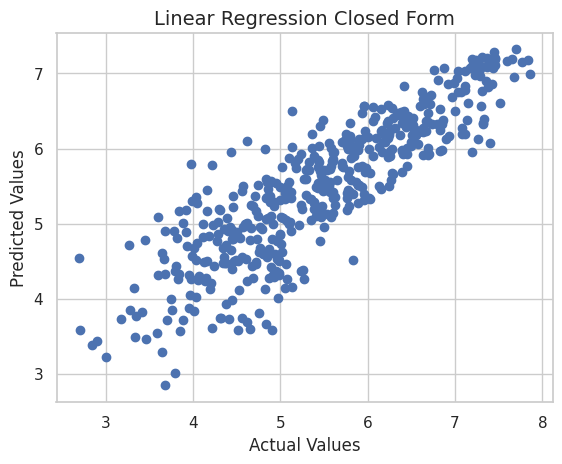

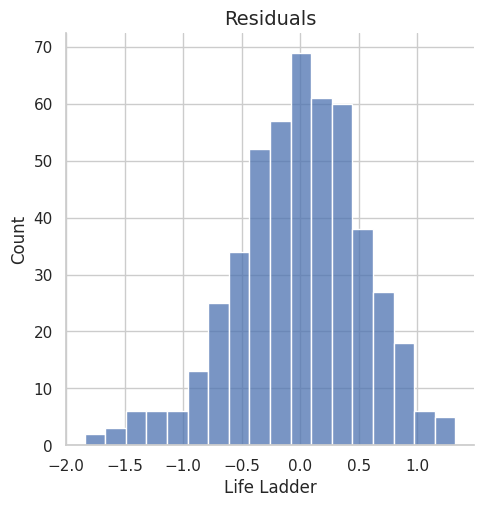

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, reg_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, reg_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, reg_y_pred)))

plot_model(y_test,reg_y_pred,'Linear Regression Closed Form')
plt.show()

# Plotting Residuals
sns.displot((y_test - reg_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(reg, X_train, y_train, cv=4)
print("Closed form solution - Cross validation scores:", scores)
print("Closed form solution - Mean cross-validation score:", np.mean(scores))

Closed form solution - Cross validation scores: [0.76626336 0.75237159 0.74977424 0.76058977]
Closed form solution - Mean cross-validation score: 0.7572497382331427


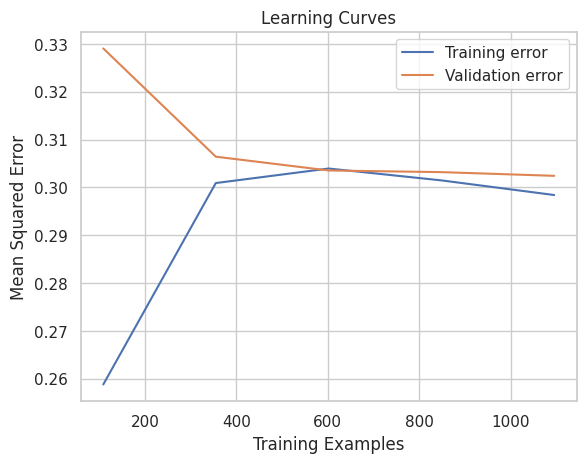

In [ ]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(reg, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

In [ ]:
from sklearn.linear_model import SGDRegressor

sgd = SGDRegressor().fit(X_train, y_train)
sgd_y_pred = sgd.predict(X_test)

print('Linear Regression (SGD) R2 score:', sgd.score(X_test, y_test))
print('Linear Regression (SGD) MAE:', metrics.mean_absolute_error(y_test, sgd_y_pred))
print('Linear Regression (SGD) MSE:', metrics.mean_squared_error(y_test, sgd_y_pred))
print('Linear Regression (SGD) RMSE:', np.sqrt(metrics.mean_squared_error(y_test, sgd_y_pred)))
best_model['Name'].append('SGD')
best_model['MSE'].append(metrics.mean_squared_error(y_test, sgd_y_pred))
best_model['R2 score'].append(sgd.score(X_test, y_test))

Linear Regression (SGD) R2 score: -2.4235167685814895e+22
Linear Regression (SGD) MAE: 171418367363.75925
Linear Regression (SGD) MSE: 2.9899253641463206e+22
Linear Regression (SGD) RMSE: 172914006493.00568


MAE: 171418367363.75925
MSE: 2.9899253641463206e+22
RMSE: 172914006493.00568


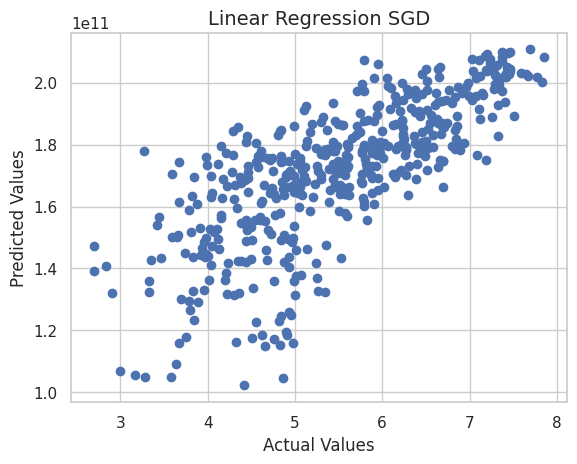

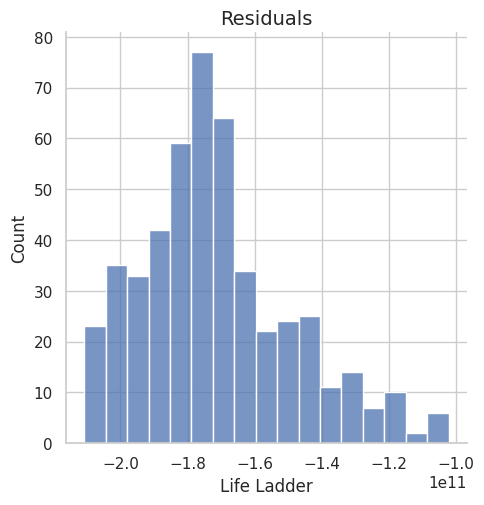

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, sgd_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, sgd_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, sgd_y_pred)))

plot_model(y_test,sgd_y_pred,'Linear Regression SGD')
plt.show()

# Plotting Residuals
sns.displot((y_test - sgd_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(sgd, X_train, y_train, cv=4)
print("SGD - Cross validation scores:", scores)
print("SGD - Mean cross-validation score:", np.mean(scores))

SGD - Cross validation scores: [-9.37273080e+19 -1.84585447e+20 -2.59172932e+23 -5.63270634e+20]
SGD - Mean cross-validation score: -6.500362881780949e+22


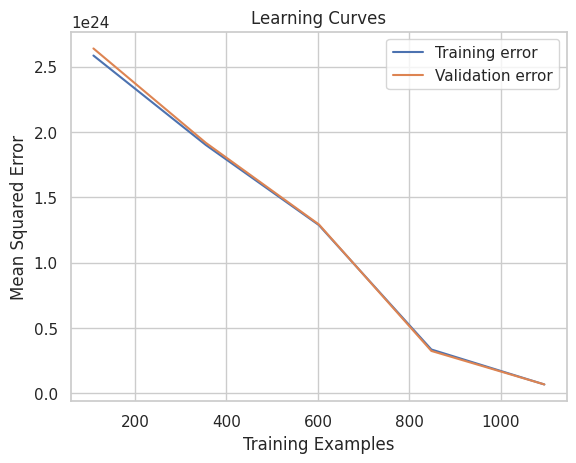

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(sgd, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

In [ ]:
from sklearn.linear_model import Ridge

ridge = Ridge(alpha=0.5,fit_intercept=True).fit(X_train, y_train)
ridge_y_pred = ridge.predict(X_test)

print('Ridge Regression R2 score:', ridge.score(X_test, y_test))
best_model['Name'].append('Ridge Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, ridge_y_pred))
best_model['R2 score'].append(ridge.score(X_test, y_test))

Ridge Regression R2 score: 0.760338994374667


MAE: 0.42686999032894574
MSE: 0.29567301898035236
RMSE: 0.5437582357816315


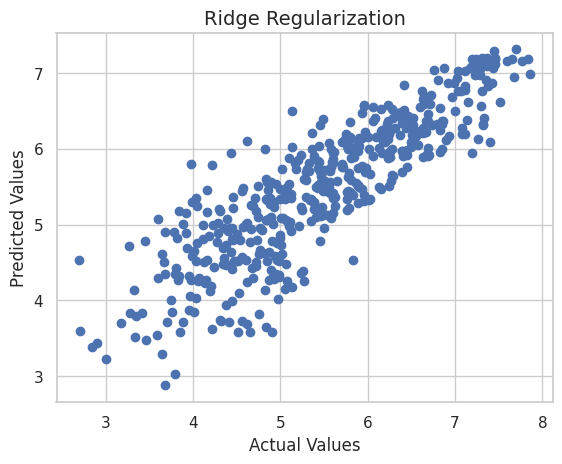

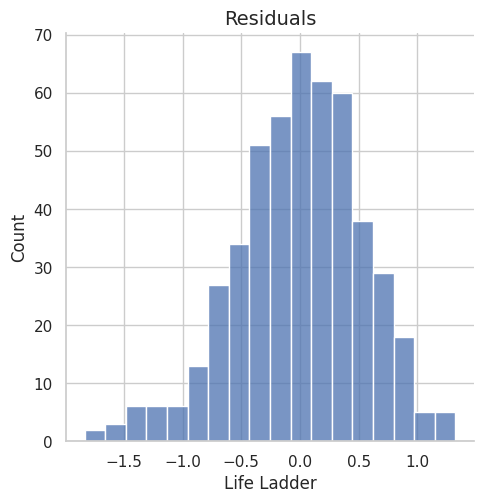

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, ridge_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, ridge_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ridge_y_pred)))

plot_model(y_test,ridge_y_pred,'Ridge Regularization')

# Plotting Residuals
sns.displot((y_test - ridge_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

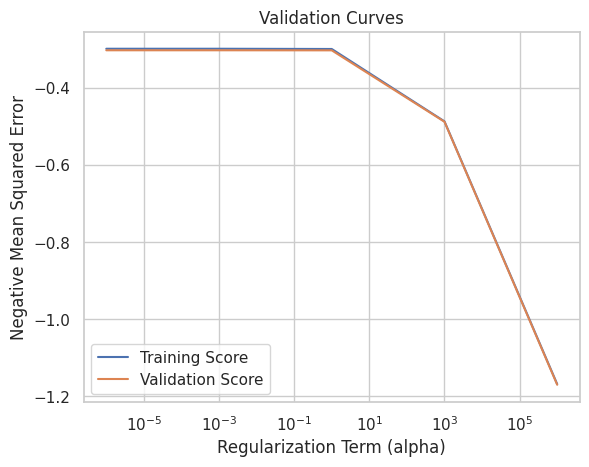

In [ ]:
from sklearn.model_selection import validation_curve

# Define the range of values for the regularization term
param_range = np.logspace(-6, 6, 5)

# Calculate the training and validation scores for different values of the regularization term
train_scores, valid_scores = validation_curve(ridge, X_train, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

# Plot the validation curve
plt.plot(param_range, np.mean(train_scores, axis=1), label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1), label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

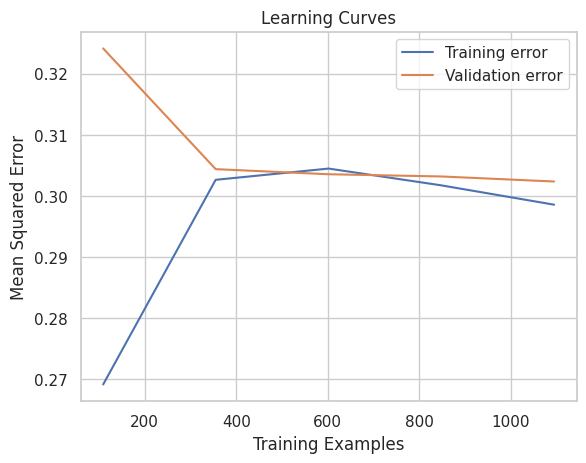

In [ ]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(ridge, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Ridge Regularization R2 score for alpha 0.0: 0.7606244438881958
MAE: 0.42621557250492287
MSE: 0.29532085606085157
RMSE: 0.5434343162341255



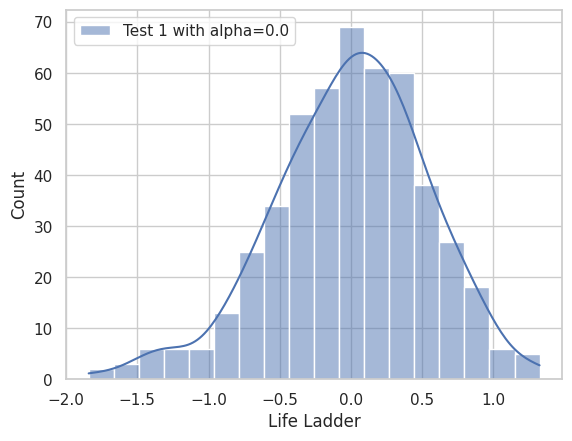

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.2: 0.7605259437587286
MAE: 0.4264530585797368
MSE: 0.29544237700070375
RMSE: 0.5435461130398264



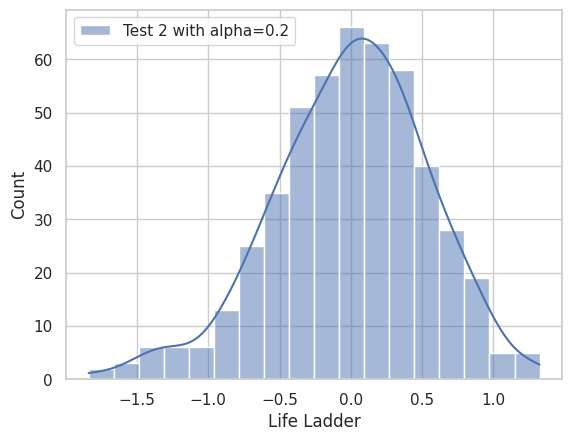

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.4: 0.760405952672027
MAE: 0.4267291790439319
MSE: 0.2955904116247062
RMSE: 0.5436822708390501



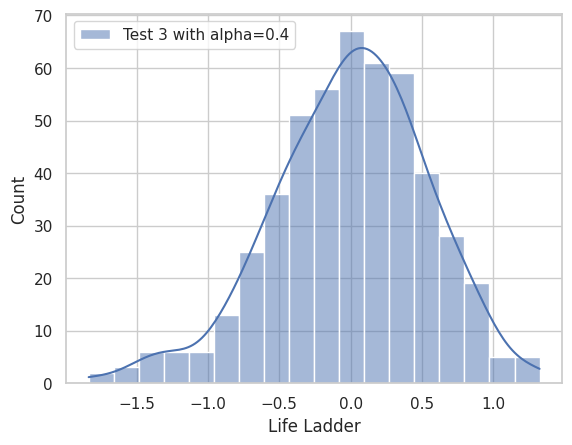

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.7: 0.7601930133028616
MAE: 0.42715794048843875
MSE: 0.2958531177999417
RMSE: 0.5439238161727631



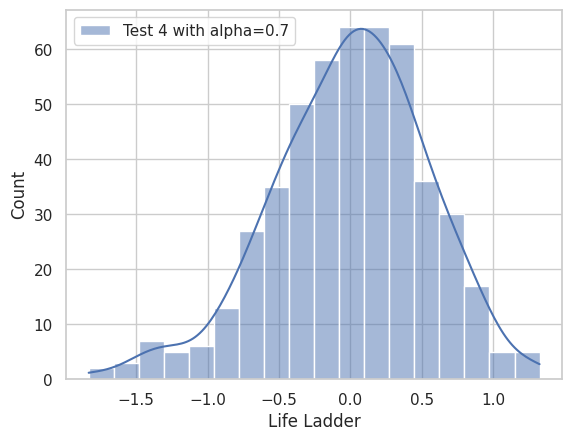

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 1.0: 0.7599485417624635
MAE: 0.42762854167087094
MSE: 0.2961547256406318
RMSE: 0.5442009974638339



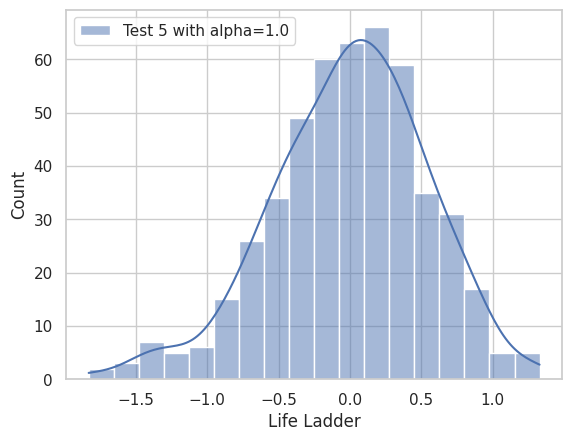

<Figure size 640x480 with 0 Axes>

In [ ]:
alpha = [0.0,0.2,0.4,0.7,1.0]
for n,i in enumerate(alpha):
    ridge_dic = {}
    ridge_test = Ridge(alpha=i,fit_intercept=True).fit(X_train, y_train)
    ridge_test_y_pred = ridge_test.predict(X_test)
    name = 'Test {} with alpha={}'.format(n+1,i)
    ridge_dic[name] = y_test-ridge_test_y_pred
    print('Ridge Regularization R2 score for alpha {}: {}'.format(i, ridge_test.score(X_test, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, ridge_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, ridge_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ridge_test_y_pred)))
    print()
    ridge_df = pd.DataFrame(ridge_dic)
    sns.set(style="whitegrid")
    sns.histplot(ridge_df,kde=True)
    plt.xlabel('Life Ladder')
    plt.figure()
    plt.show()

In [ ]:
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.5).fit(X_train, y_train)
lasso_y_pred = lasso.predict(X_test)

print('Lasso Regression R2 score:', lasso.score(X_test, y_test))
best_model['Name'].append('Lasso Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, lasso_y_pred))
best_model['R2 score'].append(lasso.score(X_test, y_test))

Lasso Regression R2 score: 0.52120395761349


MAE: 0.6325550630012634
MSE: 0.5906971430704038
RMSE: 0.768568242298889


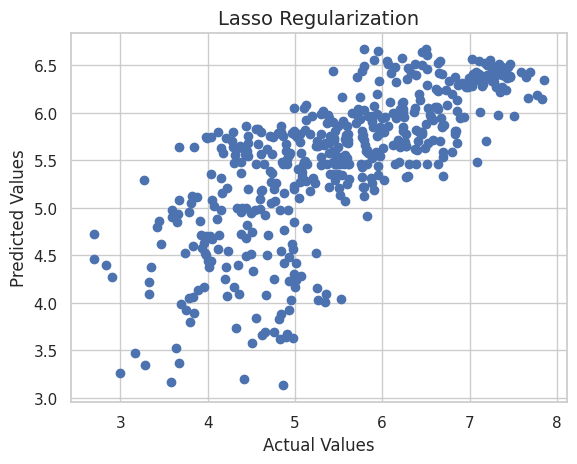

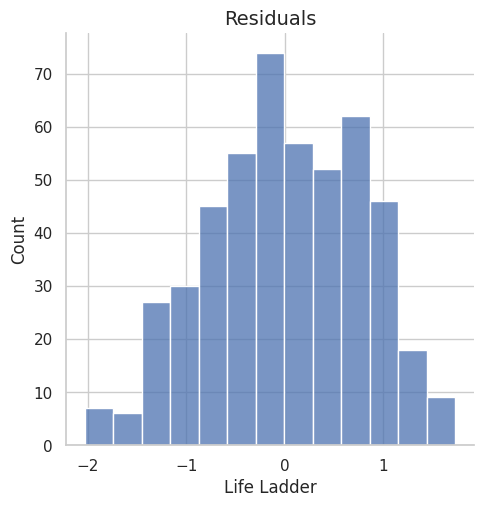

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, lasso_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, lasso_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lasso_y_pred)))

plot_model(y_test,lasso_y_pred,'Lasso Regularization')
plt.show()

# Plotting Residuals
sns.displot((y_test - lasso_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

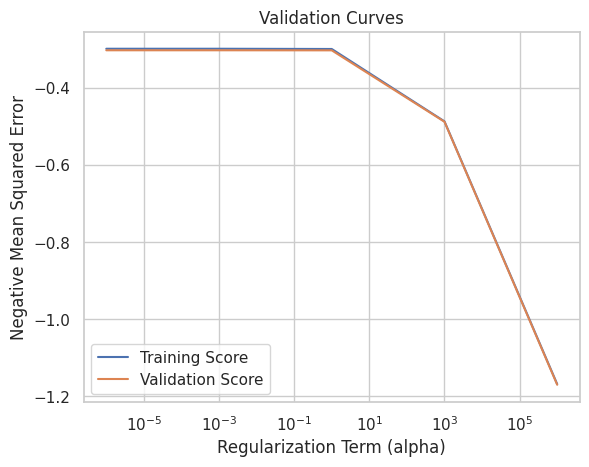

In [ ]:
# Define the range of values for the regularization term
param_range = np.logspace(-6, 6, 5)

# Calculate the training and validation scores for different values of the regularization term
train_scores, valid_scores = validation_curve(ridge, X_train, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

# Plot the validation curve
plt.plot(param_range, np.mean(train_scores, axis=1), label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1), label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

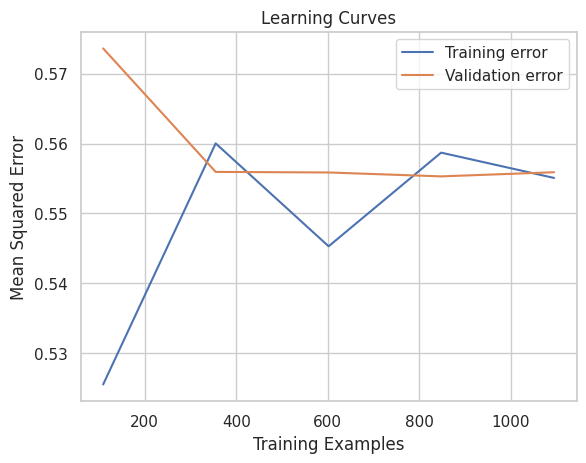

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(lasso, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Lasso Regression R2 score for alpha 0.0: 0.760624443888196
MAE: 0.4262155725049227
MSE: 0.2953208560608513
RMSE: 0.5434343162341253



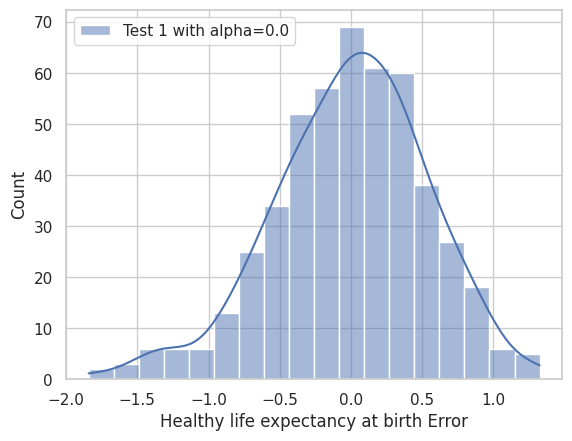

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.2: 0.5434810236151957
MAE: 0.6162621997277704
MSE: 0.5632136259184894
RMSE: 0.7504755998155366



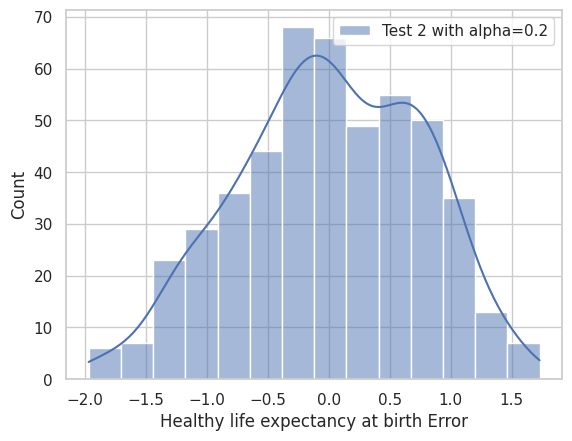

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.4: 0.5220506583401392
MAE: 0.6314331107321669
MSE: 0.5896525569502381
RMSE: 0.7678883753191202



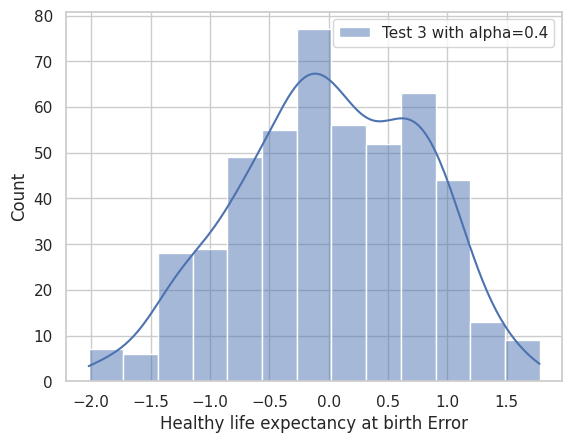

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.7: 0.5186478582738534
MAE: 0.6350516103076163
MSE: 0.5938506373428328
RMSE: 0.7706170497353616



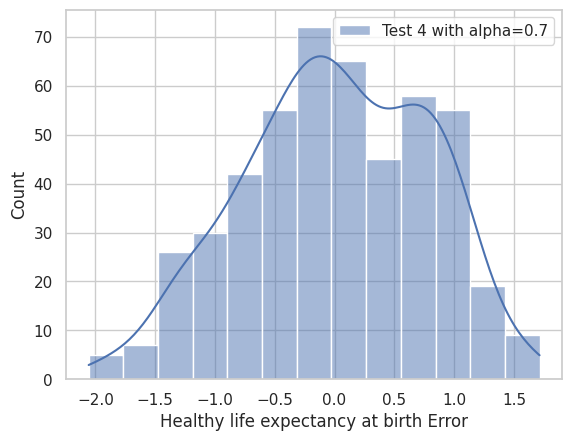

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 1.0: 0.5126569645485519
MAE: 0.6395350523184612
MSE: 0.6012416838317202
RMSE: 0.7753977584644671



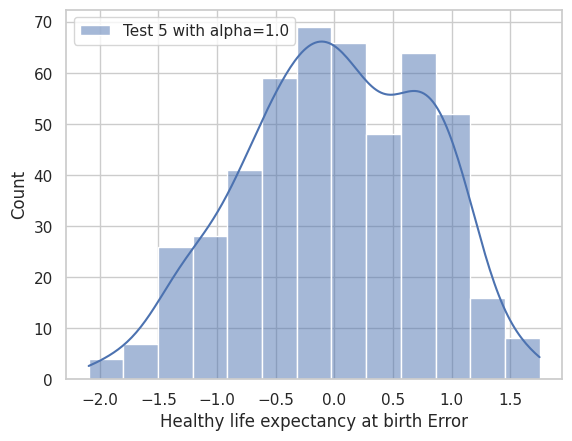

<Figure size 640x480 with 0 Axes>

In [ ]:
alpha = [0.0,0.2,0.4,0.7,1.0]
for n,i in enumerate(alpha):
    lasso_dic = {}
    lasso_test = Lasso(alpha=i).fit(X_train, y_train)
    lasso_test_y_pred = lasso_test.predict(X_test)
    name = 'Test {} with alpha={}'.format(n+1,i)
    lasso_dic[name] = y_test-lasso_test_y_pred
    print('Lasso Regression R2 score for alpha {}: {}'.format(i, lasso_test.score(X_test, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, lasso_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, lasso_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lasso_test_y_pred)))
    print()
    lasso_df = pd.DataFrame(lasso_dic)
    sns.set(style="whitegrid")
    sns.histplot(lasso_df,kde=True)
    plt.xlabel('Healthy life expectancy at birth Error')
    plt.figure()
    plt.show()

In [ ]:
from sklearn.linear_model import ElasticNet

elastic_net = ElasticNet(alpha=0.5, l1_ratio=0.5).fit(X_train, y_train)
elastic_net_y_pred = elastic_net.predict(X_test)

print('Elastic Net Regression R2 score: ', elastic_net.score(X_test, y_test))
best_model['Name'].append('Elastic Net Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, elastic_net_y_pred))
best_model['R2 score'].append(elastic_net.score(X_test, y_test))

Elastic Net Regression R2 score:  0.5226981570909921


MAE: 0.6303489600837245
MSE: 0.5888537289976006
RMSE: 0.7673680531515503


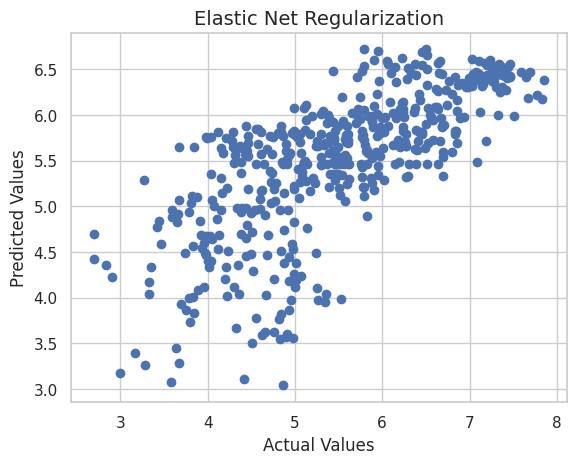

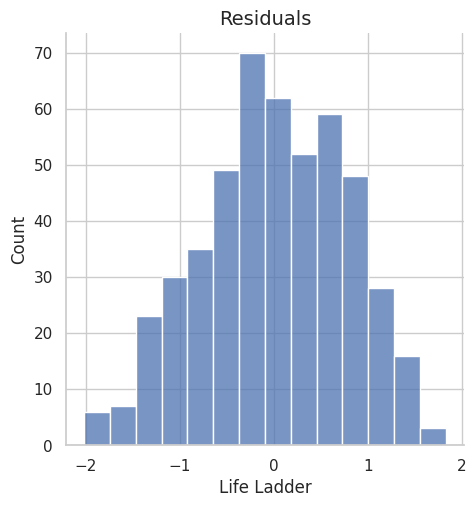

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, elastic_net_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, elastic_net_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, elastic_net_y_pred)))

plot_model(y_test,elastic_net_y_pred,'Elastic Net Regularization')
plt.show()

# Plotting Residuals
sns.displot((y_test - elastic_net_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

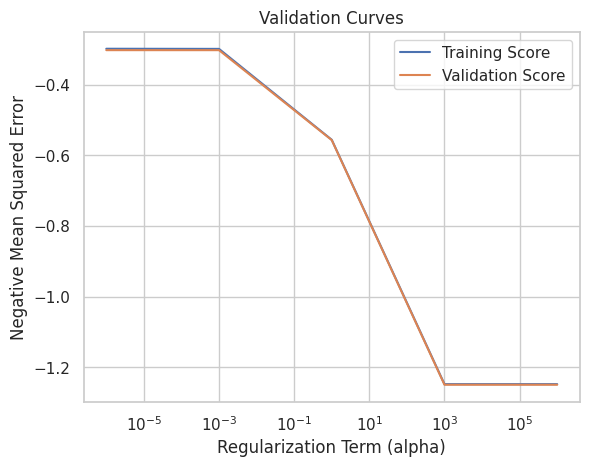

In [ ]:
# Define the range of values for the regularization term
param_range = np.logspace(-6, 6, 5)

# Calculate the training and validation scores for different values of the regularization term
train_scores, valid_scores = validation_curve(elastic_net, X_train, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

# Plot the validation curve
plt.plot(param_range, np.mean(train_scores, axis=1), label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1), label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

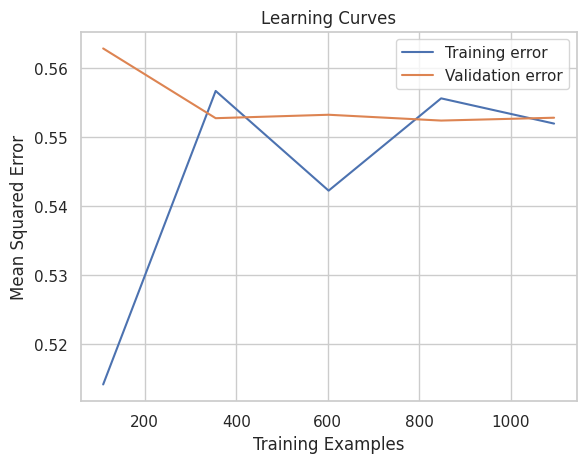

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(elastic_net, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Elastic-Net Regularization R2 score for alpha 0.0 and L1-ratio 1.0: 0.760624443888196
MAE: 0.4262155725049227
MSE: 0.2953208560608513
RMSE: 0.5434343162341253



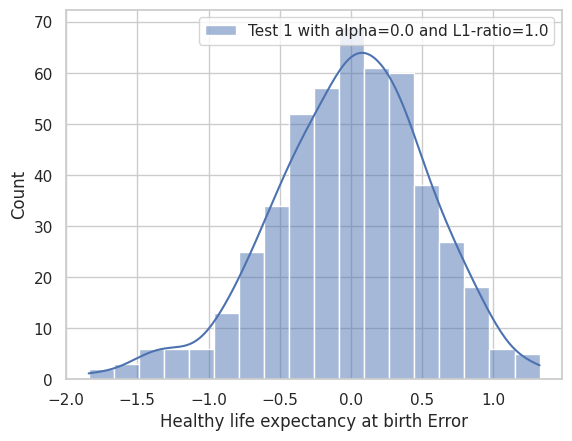

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.2 and L1-ratio 0.7: 0.5818562306085955
MAE: 0.5895869423677969
MSE: 0.5158696148386366
RMSE: 0.7182406385318479



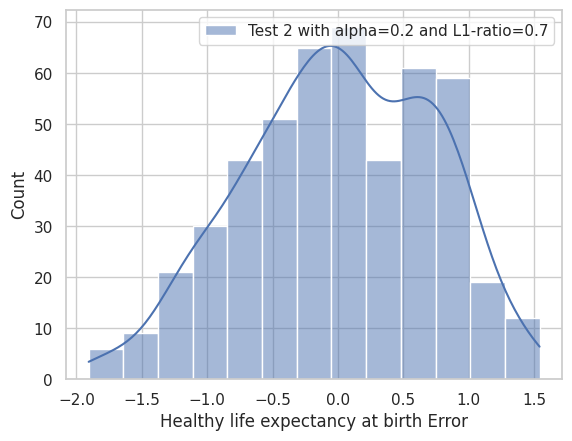

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.4 and L1-ratio 0.4: 0.5584506318743512
MAE: 0.6062325468877153
MSE: 0.5447454180621929
RMSE: 0.7380687082258622



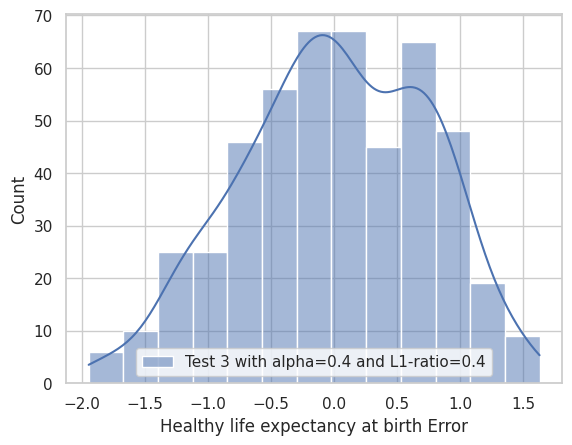

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.7 and L1-ratio 0.2: 0.5554588008514731
MAE: 0.6083278955549043
MSE: 0.5484364803962813
RMSE: 0.7405649737843948



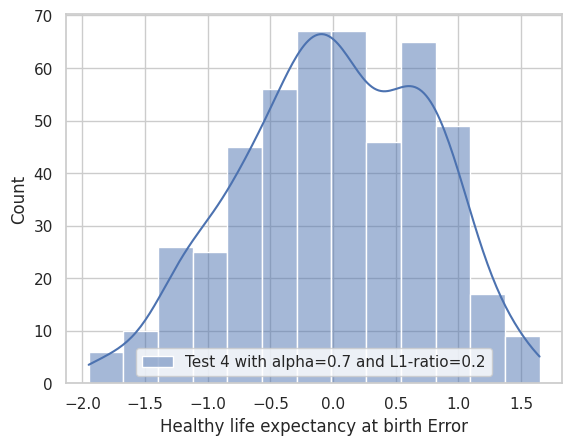

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 1.0 and L1-ratio 0.0: 0.5860744001545224
MAE: 0.5865008192440883
MSE: 0.5106656021084014
RMSE: 0.7146087055923692



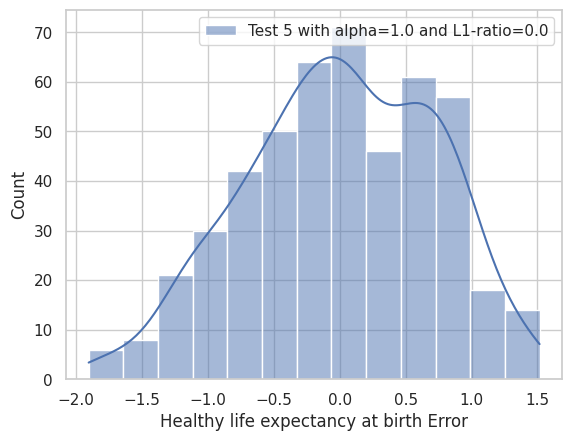

<Figure size 640x480 with 0 Axes>

In [ ]:
alpha = [0.0,0.2,0.4,0.7,1.0]
l1_ratio = [1.0,0.7,0.4,0.2,0.0]
elastic_net_dic = {}
for n,i in enumerate(zip(alpha,l1_ratio)):
    elastic_net_dic = {}
    elastic_net_test = elastic_net = ElasticNet(alpha=i[0], l1_ratio=i[1]).fit(X_train, y_train)
    elastic_net_test_y_pred = elastic_net_test.predict(X_test)
    name = 'Test {} with alpha={} and L1-ratio={}'.format(n+1,i[0],i[1])
    elastic_net_dic[name] = y_test-elastic_net_test_y_pred
    print('Elastic-Net Regularization R2 score for alpha {} and L1-ratio {}: {}'.format(i[0], i[1], elastic_net_test.score(X_test, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, elastic_net_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, elastic_net_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, elastic_net_test_y_pred)))
    print()
    elastic_net_df = pd.DataFrame(elastic_net_dic)
    sns.set(style="whitegrid")
    sns.histplot(elastic_net_df,kde=True)
    plt.xlabel('Healthy life expectancy at birth Error')
    plt.figure()
    plt.show()